In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import csv 
import os
import re 

from collections import defaultdict
from sklearn.model_selection import train_test_split
from PIL import Image, UnidentifiedImageError
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing import image as keras_image
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
dataset_path = "/content/drive/My Drive/Public"

#  bài tập thực hành 1 : Thống kê dữ liệu

### Input:
* Thư mục cha chứa các thư mục con - mỗi thư mục con tương ứng với tên của từng hiệu xe (Honda, Suzuki, VinFast, Others)
* Các ảnh được đặt tên theo quy ước: các tập tin ảnh theo quy ước

### Output: 
* File CarDataset-1.csv - Thống kê số lượng ảnh theo từng SV
    * Mỗi dòng sẽ có các thông tin cách nhau bằng dấu phẩy, theo quy ước: MSSV, All, Số lượng.
    * Số lượng có thể là số thực vì một ảnh có thể có đóng góp từ nhiều sinh viên
* File CarDataset-2.csv - Thống kê số lượng ảnh theo từng Hiệu xe mà từng SV đóng góp
    * Mỗi dòng sẽ có các thông tin cách nhau bằng dấu phẩy, theo quy ước: MSSV, Hiệu xe, Số lượng.
    * Số lượng có thể là số thực vì một ảnh có thể có đóng góp từ nhiều sinh viên
    * Chỉ chấp nhận file .jpg, .jpeg và .png

In [3]:
def split_file_name(file_name):
    contribution = {}
    match = re.match(r'((?:\d{8}-?)+)\.([a-zA-Z]+)\.\d+', file_name)
    if match:
        mssv_group, brand = match.groups()
        mssv_list = mssv_group.split('-')
        weight = 1 / len(mssv_list)
        for mssv in mssv_list:
            contribution[mssv] = weight
        return contribution, brand
    return {}, None

In [4]:
def process_dataset(path):
    student_totals = defaultdict(float)
    student_by_brand = defaultdict(lambda: defaultdict(float))
    for brand in os.listdir(path):
        brand_path = os.path.join(path, brand)
        if not os.path.isdir(brand_path):
            continue

        for file_name in os.listdir(brand_path):
            if file_name.lower().endswith(('.jpg', '.jpeg', '.png')):
                contribution, brand_name = split_file_name(file_name)

                if brand_name:
                    for mssv, weight in contribution.items():
                        student_totals[mssv] += weight
                        student_by_brand[mssv][brand_name] += weight
    with open('CarDataset-1.csv', mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(['MSSV', 'All', 'Số lượng'])
        for mssv, total in student_totals.items():
            writer.writerow([mssv, 'All', round(total, 2)])

    with open('CarDataset-2.csv', mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(['MSSV', 'Hiệu xe', 'Số lượng'])
        for mssv, brands in student_by_brand.items():
            for brand, total in brands.items():
                writer.writerow([mssv, brand, round(total, 2)])

In [5]:
process_dataset(dataset_path)
print('CarDataset-1.csv and CarDataset-2.csv have been created!')

CarDataset-1.csv and CarDataset-2.csv have been created!


# Bài tập thực hành 2 : Data splitting

### Input:
* Thư mục cha chứa các thư mục con - mỗi thư mục con tương ứng với tên của từng hiệu xe (Honda, Suzuki, VinFast, Yamaha, Others)
* Các ảnh được đặt tên theo quy ước: các tập tin ảnh theo quy ước
* Số splits NumSplits - mặc định NumSplits=5 (tương đương 5-fold CV)

### Output:
* File CarDataset.csv - Tập tin chứa tất cả ảnh của dataset
* File CarDataset-Splits-[1..5]-[Train/Test].csv - Phân chia thành các splits, mỗi split gồm các ảnh được chia thành thành 2 tập Train - Test
    * Chương trình sẽ đọc dữ liệu từ file CarDataset.csv, sau đó với mỗi hiệu xe, chia ngẫu nhiên thành 5 tập dữ liệu. Lưu ý là phải chia theo hiệu xe, để đảm bảo dữ liệu Train/Test có dữ liệu của các hiệu xe.
    * Từ 5 tập dữ liệu chia ngẫu nhiên theo các hiệu xe Xij (i là thứ tự tập dữ liệu, j là CategoryID), gom lại thành 5 tập dữ liệu lớn hơn Xi, sao cho mỗi tập dữ liệu này chứa đủ dữ liệu của tất cả các hiệu xe. Tức là Xi = Union(Xij)
    * Từ 5 tập dữ liệu Xi này (tương ứng với FOLDi ở trong hình vẽ trên), tạo ra 5 splits Split-i
    * Với mỗi bộ dữ liệu Split-i, ghi xuống thành 2 tập tin tương ứng với Train, Test. Ví dụ Split-1 thì ghi thành tập tin CarDataset-Splits-1-Train.csv và CarDataset-Splits-1-Test.csv. Tập Train gồm 4 bộ, Test gồm bộ còn lại. Ví dụ
        * Split-1: tập Train sẽ gồm X2, X3, X4, X5, tập Test là X1
        * Split-5: tập Train sẽ gồm X1, X2, X3, X4, tập Test là X5
    * Mỗi dòng sẽ có các thông tin cách nhau bằng dấu phẩy, theo quy ước: ImageFullPath, CategoryID

In [6]:
label_data = {
    "Others": 0,
    "Honda": 1,
    "Hyundai": 2,
    "KIA": 3,
    "Mazda": 4,
    "Mitsubishi" : 5,
    "Toyota": 6,
    "Suzuki": 7,
    "Vinfast": 8
}

In [7]:
def scan_dataset(path):
    car_dataset = []

    for brand, category_id in label_data.items():
        brand_folder = os.path.join(path, brand)
        if not os.path.isdir(brand_folder):
            print(f"Skipping non-existent folder: {brand_folder}")
            continue

        for file_name in os.listdir(brand_folder):
            if file_name.lower().endswith('.jpg'):
                image_path = f"{brand}/{file_name}"
                car_dataset.append((image_path, category_id))

    others_category_id = label_data["Others"]
    for file_name in os.listdir(path):
        file_path = os.path.join(path, file_name)
        if os.path.isfile(file_path) and file_name.lower().endswith('.jpg'):
            image_path = f"Others/{file_name}"
            car_dataset.append((image_path, others_category_id))

    with open('CarDataset.csv', mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(['ImageFullPath', 'CategoryID'])
        writer.writerows(car_dataset)

    print(f"CarDataset.csv created with {len(car_dataset)} entries.")
    return car_dataset

In [8]:
def create_split_dataset(car_dataset, num_splits=5):
    category_data = defaultdict(list)
    for image_path, category_id in car_dataset:
        category_data[category_id].append(image_path)
    
    splits = {i: defaultdict(list) for i in range(num_splits)}
    for category_id, images in category_data.items():
        random.shuffle(images)
        fold_size = len(images) // num_splits
        for i in range(num_splits):
            start_idx = i * fold_size
            end_idx = start_idx + fold_size if i < num_splits - 1 else len(images)
            splits[i][category_id].extend(images[start_idx:end_idx])
        
    for i in range(num_splits):
        train_split = []
        test_split = []
        train_stat = defaultdict(int)
        test_stat = defaultdict(int)

        # Chia Train/Test
        for j in range(num_splits):
            for category_id, images in splits[j].items():
                if i == j:
                    test_split.extend([(image, category_id) for image in images])
                    test_stat[category_id] += len(images)
                else:
                    train_split.extend([(image, category_id) for image in images])
                    train_stat[category_id] += len(images)

        train_file = f'CarDataset-Splits-{i+1}-Train.csv'
        with open(train_file, mode='w', newline='', encoding='utf-8') as file:
            writer = csv.writer(file)
            writer.writerow(['ImageFullPath', 'CategoryID'])
            writer.writerows(train_split)

        test_file = f'CarDataset-Splits-{i+1}-Test.csv'
        with open(test_file, mode='w', newline='', encoding='utf-8') as file:
            writer = csv.writer(file)
            writer.writerow(['ImageFullPath', 'CategoryID'])
            writer.writerows(test_split)

        # Hiển thị danh sách tên tập tin ảnh trong Split Train/Test
        print(f"\nSplit-{i+1} Train Files:")
        for image, category_id in train_split:
            print(f"  {image} (CategoryID: {category_id})")

        print(f"\nSplit-{i+1} Test Files:")
        for image, category_id in test_split:
            print(f"  {image} (CategoryID: {category_id})")

        # Thống kê số lượng ảnh cho từng CategoryID
        print(f"\nStatistics for Split-{i+1}:")
        print("Train:")
        for category_id, count in train_stat.items():
            print(f"  CategoryID {category_id}: {count} images")

        print("Test:")
        for category_id, count in test_stat.items():
            print(f"  CategoryID {category_id}: {count} images")

In [9]:
org_dataset = scan_dataset(dataset_path)
create_split_dataset(org_dataset)

CarDataset.csv created with 35465 entries.

Split-1 Train Files:
  Others/22520779-22521587.Others.288.jpg (CategoryID: 0)
  Others/22521492-22521599.Others.107.jpg (CategoryID: 0)
  Others/22520779-22521587.Others.66.jpg (CategoryID: 0)
  Others/22521070-22520211.Others.228.jpg (CategoryID: 0)
  Others/22520779-22521587.Others.872.jpg (CategoryID: 0)
  Others/22521070-22520211.Others.282.jpg (CategoryID: 0)
  Others/22521070-22520211.Others.276.jpg (CategoryID: 0)
  Others/22521027-22520195-22521060.Others.9.jpg (CategoryID: 0)
  Others/22521586-22521559.Others.20.jpg (CategoryID: 0)
  Others/22521692-22521676.Others.82.jpg (CategoryID: 0)
  Others/22520779-22521587.Others.998.jpg (CategoryID: 0)
  Others/22521027-22520195-22521060.Others.716.jpg (CategoryID: 0)
  Others/22520521-22520884.Others.45.jpg (CategoryID: 0)
  Others/22521342-22520970.Others.34.jpg (CategoryID: 0)
  Others/22520394-22520395.Others.71.jpg (CategoryID: 0)
  Others/22520779-22521587.Others.273.jpg (CategoryID: 

# DATA CLUSTERING

### Input: Danh sách các ảnh được lưu trong tập tin, ví dụ CarDataset-Splits-1-Train.csv
### Outpu: Danh sách các clusters và hiển thị các ảnh trong cluster

In [14]:
file_path = '/content/CarDataset.csv'
dataset = pd.read_csv(file_path)

model = MobileNet(weights='imagenet', include_top=False, pooling='avg', input_shape=(224, 224, 3))

In [15]:
def batch_extract_features(image_paths):
    batch_images = []
    valid_paths = []

    for img_path in image_paths:
        try:
            img = keras_image.load_img(img_path, target_size=(224, 224))
            if img.mode != 'RGB':
                img = img.convert('RGBA').convert('RGB')
            img_array = keras_image.img_to_array(img)
            batch_images.append(img_array)
            valid_paths.append(img_path)
        except (FileNotFoundError, UnidentifiedImageError):
            print(f"Skipping invalid or missing image: {img_path}")
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    if batch_images:
        batch_images = np.array(batch_images)
        batch_images = preprocess_input(batch_images)
        features = model.predict(batch_images)
        return features, valid_paths
    else:
        return np.array([]), []

In [16]:
batch_size = 32
features = []
processed_image_paths = []
image_paths = dataset['ImageFullPath'].apply(lambda x: os.path.join(dataset_path, x)).tolist()
for i in range(0, len(image_paths), batch_size):
    batch_paths = image_paths[i:i + batch_size]
    batch_features, valid_paths = batch_extract_features(batch_paths)
    features.append(batch_features)
    processed_image_paths.extend(valid_paths)

features = np.vstack(features) if features else np.array([])

filtered_dataset = pd.DataFrame({
    'ImageFullPath': processed_image_paths,
    'ClusterID': None
})

if features.size > 0:
    pca = PCA(n_components=50 )
    features_reduced = pca.fit_transform(features)

    kmeans = KMeans(n_clusters=5, random_state=42)
    kmeans.fit(features_reduced)
    labels = kmeans.labels_

    filtered_dataset['ClusterID'] = labels

output_file = "clustering_results.csv"
filtered_dataset.to_csv(output_file, index=False)
print(f"Clustering results saved to {output_file}")

post_check = filtered_dataset.groupby('ClusterID').apply(
    lambda group: (features[group.index], group['ImageFullPath'].tolist())
)

dupe_results = []

def find_duplicates_within_cluster(cluster_features, image_paths, similarity_threshold=0.95):
    duplicates = []
    similarity_matrix = cosine_similarity(cluster_features)

    for i in range(len(cluster_features)):
        for j in range(i + 1, len(cluster_features)):
            if similarity_matrix[i, j] > similarity_threshold:
                duplicates.append({
                    'Image1': image_paths[i],
                    'Image2': image_paths[j],
                    'Similarity': similarity_matrix[i, j]
                })
    return duplicates

for cluster_id, (cluster_features, image_list) in post_check.items():
    if len(image_list) > 1:
        cluster_duplicates = find_duplicates_within_cluster(cluster_features, image_list)
        for dupe in cluster_duplicates:
            dupe_results.append({'ClusterID': cluster_id, **dupe})

dupe_results_df = pd.DataFrame(dupe_results)
dupe_output_file = "refined_potential_duplicates.csv"
dupe_results_df.to_csv(dupe_output_file, index=False)
print(f"Refined potential duplicates saved to {dupe_output_file}")

dupe_results_df = pd.DataFrame(dupe_results)

all_duplicate_paths = set(dupe_results_df['Image1']).union(set(dupe_results_df['Image2']))

hau_kiem_dataset = filtered_dataset[filtered_dataset['ImageFullPath'].isin(all_duplicate_paths)]
hau_kiem_dataset.to_csv("Duplicate.csv", index=False)

filtered_dataset = filtered_dataset[~filtered_dataset['ImageFullPath'].isin(all_duplicate_paths)]
filtered_dataset.to_csv("clustering_results.csv", index=False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step
Skipping invalid or missing image: /content/drive/My Drive/Public/Others/22520348-22520530-22520837.Maybach.2.jpg
Skipping invalid or missing image: /content/drive/My Drive/Public/Others/22520348-22520530-22520837.MG.11.jpg
Skipping invalid or missing image: /content/drive/My Drive/Public/Others/22520348-22520530-22520837.MG.13.jpg
Skipping invalid or missing image: /content/drive/My Drive/Public/Others/22520348-22520530-22520837.MG.15.jpg
Skipping invalid

c:\Users\windown\PycharmProjects\helloWorld\.venv\Lib\site-packages\PIL\Image.py:1000: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 294ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

C:\Users\windown\AppData\Local\Temp\ipykernel_14716\107138190.py:32: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  post_check = filtered_dataset.groupby('ClusterID').apply(


Refined potential duplicates saved to refined_potential_duplicates.csv
Duplicates saved to Hậu Kiểm.csv
Filtered dataset saved to clustering_results.csv


In [21]:
batch_images = np.random.rand(1, 224, 224, 3)  
batch_images = preprocess_input(batch_images)
features = model.predict(batch_images)
print("The number dimension before PCA :", features.shape[-1])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
The number dimension before PCA: 1024


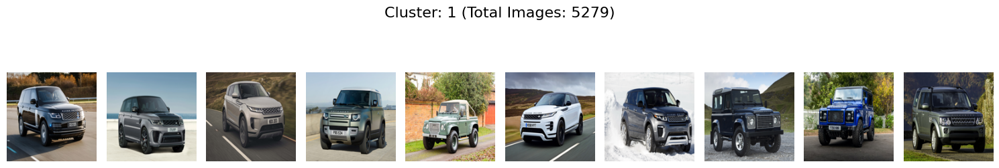

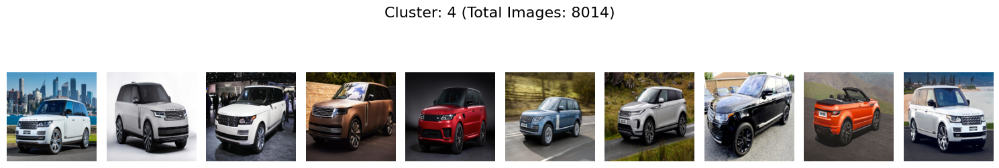

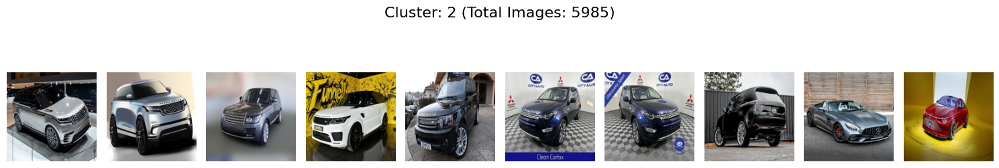

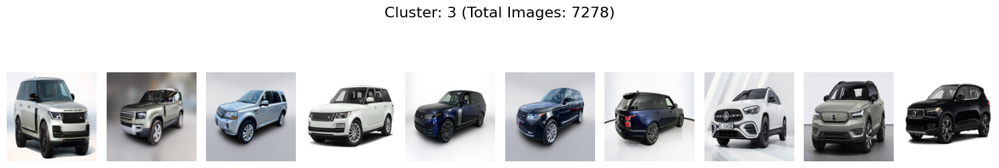

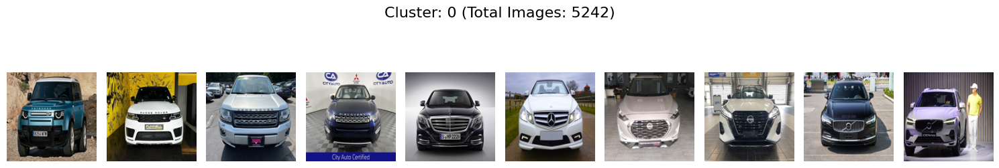

In [17]:
def display_images_by_cluster(csv_file_path, num_imgs_per_row=10, img_height=150, img_width=150):
    try:
        df = pd.read_csv(csv_file_path)
    except FileNotFoundError:
        print(f"Error: File not found at {csv_file_path}")
        return

    clusters = df['ClusterID'].unique()
    base_path = 'path_to_images_directory'

    for cluster in clusters:
        cluster_images = df[df['ClusterID'] == cluster]['ImageFullPath'].tolist()
        num_images = len(cluster_images)

        if num_images == 0:
            print(f"No images found for cluster {cluster}")
            continue

        sampled_images = cluster_images[:num_imgs_per_row]

        fig, axes = plt.subplots(1, len(sampled_images), figsize=(15, 3))
        fig.suptitle(f"Cluster: {cluster} (Total Images: {num_images})", fontsize=16)

        for i, image_path in enumerate(sampled_images):
            try:
                img = Image.open(image_path)
                img = img.resize((img_width, img_height))
                axes[i].imshow(img)
                axes[i].axis('off')
            except FileNotFoundError:
                print(f"Warning: Image file not found: {image_path}")
                axes[i].text(0.5, 0.5, "Image not found", ha="center", va="center")
                axes[i].axis('off')
            except Exception as e:
                print(f"Error loading image: {image_path}. Error: {e}")
                axes[i].text(0.5, 0.5, "Error loading image", ha="center", va="center")
                axes[i].axis('off')

        if len(sampled_images) == 1:
            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()
            continue

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

display_images_by_cluster("clustering_results.csv")